Soal 4: Audio Processing Chain

In [2]:
import numpy as np
import matplotlib.pyplot as plt
import librosa
import soundfile as sf
from IPython.display import Audio, HTML, display
import os
import matplotlib
from scipy.signal import butter, filtfilt, spectrogram
from IPython.display import Audio, display
from pydub import AudioSegment

%matplotlib inline

import librosa.display
from pydub import AudioSegment, effects, silence
import pyloudnorm as pyln

print("Library versions:")
print(f"NumPy: {np.__version__}")
print(f"Matplotlib: {matplotlib.__version__}")
print(f"Librosa: {librosa.__version__}")


Library versions:
NumPy: 2.2.6
Matplotlib: 3.10.5
Librosa: 0.11.0


<>:2: SyntaxWarning: invalid escape sequence '\S'
<>:2: SyntaxWarning: invalid escape sequence '\S'
C:\Users\Elma\AppData\Local\Temp\ipykernel_5196\2451974657.py:2: SyntaxWarning: invalid escape sequence '\S'
  input_path = "..\Soal3\Audio_Chipmunk_Combined.wav"


Durasi awal: 49.58 detik | Sample Rate: 48000 Hz


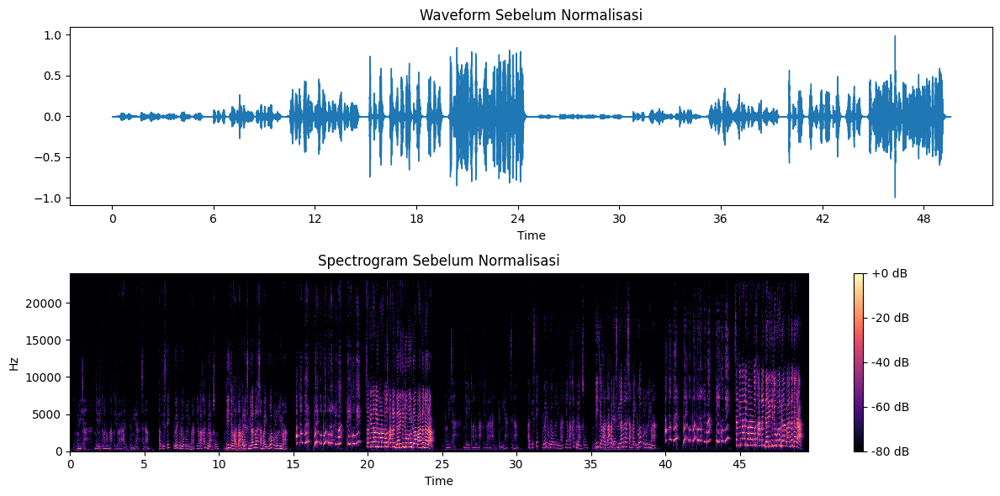

Loudness awal: -21.59 LUFS → Sesudah disesuaikan ke -16.0 LUFS
Hasil akhir disimpan ke: Audio_Chipmunk_Processed_Final.wav


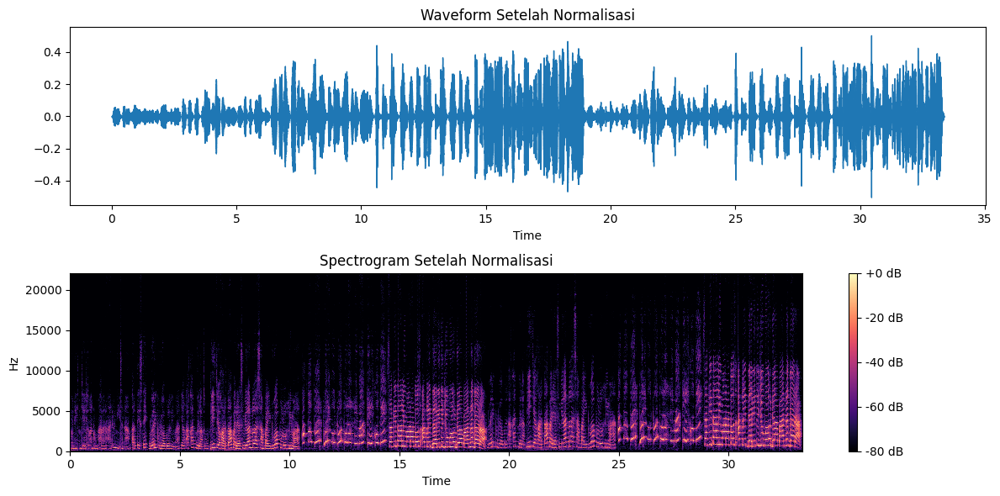

Audio Sebelum Processing:


Audio Setelah Processing:


In [6]:
# --- 1. Load Audio ---
input_path = "..\Soal3\Audio_Chipmunk_Combined.wav"
out_path = "Audio_Chipmunk_Processed_Final.wav"

y, sr = librosa.load(input_path, sr=None)
print(f"Durasi awal: {librosa.get_duration(y=y, sr=sr):.2f} detik | Sample Rate: {sr} Hz")

# --- Visualisasi Sebelum Normalisasi ---
plt.figure(figsize=(12, 6))
plt.subplot(2, 1, 1)
librosa.display.waveshow(y, sr=sr)
plt.title("Waveform Sebelum Normalisasi")

plt.subplot(2, 1, 2)
D = librosa.amplitude_to_db(np.abs(librosa.stft(y)), ref=np.max)
librosa.display.specshow(D, sr=sr, x_axis='time', y_axis='hz', cmap='magma')
plt.title("Spectrogram Sebelum Normalisasi")
plt.colorbar(format="%+2.0f dB")
plt.tight_layout()
plt.show()

# --- 2. Konversi ke AudioSegment ---
audio = AudioSegment.from_file(input_path)
audio = audio.set_frame_rate(44100).set_sample_width(2).set_channels(1)

# --- 3. Equalizer ---
audio = audio.high_pass_filter(200)   # buang frekuensi rendah
audio = audio.low_pass_filter(5000)   # batasi frekuensi tinggi

# --- 4. Gain & Fade ---
audio = audio.apply_gain(-2)           # kurangi sedikit gain
audio = audio.fade_in(100).fade_out(300)  # transisi halus di awal & akhir

# --- 5. Normalisasi berdasarkan LUFS (-16 LUFS target) ---
temp_path = "temp_audio.wav"
audio.export(temp_path, format="wav")

data, rate = sf.read(temp_path)
meter = pyln.Meter(rate)
loudness = meter.integrated_loudness(data)

target_loudness = -16.0
loudness_diff = target_loudness - loudness
audio = audio.apply_gain(loudness_diff)

print(f"Loudness awal: {loudness:.2f} LUFS → Sesudah disesuaikan ke {target_loudness} LUFS")

# --- 6. Compression ---
audio = effects.compress_dynamic_range(
    audio, threshold=-20.0, ratio=3.0, attack=5, release=50
)

# --- 7. Noise Gate + Silence Trimming ---
# Pisahkan bagian yang memiliki suara (non-silence)
audio_chunks = silence.split_on_silence(
    audio,
    min_silence_len=200,    # minimal durasi diam 200ms
    silence_thresh=-40       # ambang diam
)

# Jika ada hasil potongan, gabungkan ulang semuanya
if len(audio_chunks) > 0:
    trimmed_audio = audio_chunks[0]
    for chunk in audio_chunks[1:]:
        trimmed_audio += chunk
    audio = trimmed_audio

# Tambahkan fade halus untuk menghindari pop
audio = audio.fade_in(50).fade_out(50)

# --- 8. Simpan hasil akhir ---
audio.export(out_path, format="wav")
print(f"Hasil akhir disimpan ke: {out_path}")

# --- 9. Visualisasi Sesudah Normalisasi ---
y2, sr2 = librosa.load(out_path, sr=None)

plt.figure(figsize=(12, 6))
plt.subplot(2, 1, 1)
librosa.display.waveshow(y2, sr=sr2)
plt.title("Waveform Setelah Normalisasi")

plt.subplot(2, 1, 2)
D2 = librosa.amplitude_to_db(np.abs(librosa.stft(y2)), ref=np.max)
librosa.display.specshow(D2, sr=sr2, x_axis='time', y_axis='hz', cmap='magma')
plt.title("Spectrogram Setelah Normalisasi")
plt.colorbar(format="%+2.0f dB")
plt.tight_layout()
plt.show()

# --- 10. Putar audio sebelum dan sesudah ---
print("Audio Sebelum Processing:")
display(Audio(input_path))

print("Audio Setelah Processing:")
display(Audio(out_path))


1. Perubahan dinamika yang terjadi setelah melalui proses equalizer, gain/fade, normalization, compression, noise gate, dan silence trimming suaranya menjadi lebih seimbang, bagian yang pelan bisa terdengar, dan bagian yang keras tidak terlalu keras. kemudian durasinya juga menjadi lebih singkat dari 49 detik menjadi 33 detik karena jeda yang ada pada suara di potong.
2. perbedaan antara normalisasi peak dan normalisasi LUFS adalah kalau normalisasi peak dia menyesuaikan puncak tertinggi dari gelombang suara supaya tidak melebihi batas tertentu (biasanya 0 dB) tapi kenyaringannya/loudnessnya tidak selalu berubah. kalau normalisasi LUFS dia mengatur kenyaringan rata-rata supaya sesuai dengan standar pendengaran manusia (contohnya -16 LUFS). LUFS lebih akurat untuk memastikan volume antar file terdengar konsisten.
3. kualitas suara setelah proses normalisasi dan loudness optimization yaitu suaranya lebih seimbang antara yg pelan dan keras, kemudian lebih jernih sehingga lebih enak untuk di dengar.
4. kelebihan dan kekurangan dari pengoptimalan loudness dalam konteks rekaman suara adalah:
    kelebihan: 
    - volume suara jadi lebih konsisten
    - lebih enak untuk didengar
    - cocok digunakan untuk distribusi digital (youtube, spotify, dll) yang memiliki standar loudness
    kekurangan:
    - kalau terlalu kuat, dinamika suara aslinya bisa hilang
    - adanya resiko distortion/suata terdengar datar karena di kompres berlebihan